딥러닝과 음악이 만난다면 어떤 Task를 처리할 수 있을까요? 
Speech나 Audio 데이터와는 또 다른 매력을 가지고 있는 음악!
과연 음악데이터는 어떤 특징을 가지고 있고 이를 이용해서 우리는 또 어떤 멋진 문제를 해결할 수 있을까요??

먼저 우리가 Music Data로 부터 어떤 정보를 얻을 수 있는지 알아보고
과연 학계에서는 어떤 Task를 풀고 있는지를 확인해보려고합니다.
마지막으로는 Pytorch를 이용하여 아주 간단한 아키텍쳐를 구현해 보고자합니다!

Python, Pytorch, 그리고 Librosa 함께 우리 음악 데이터를 분석해 봅시다!

### Contents
- (2:00~3:00) Sound Data의 이해와 전처리와 시각화
- (3:00~3:30) Music-Deep Learing 의 주요 Task Review
- (3:30~3:40) Break
- (3:40~5:00) Music Gerne Classification, Music Generation (Optional)

### 이 튜토리얼을 듣고 여러분이 얻어갈 것
- Speech에서도 응용할만한 Sound Data에 대한 기초 이해
- 리뷰 논문을 읽고온 대학원생의 리뷰 논문 리뷰
- 음악 딥러닝 논문 구현에서 쉽게 경험하는 실수
- 실험하기 좋은 아키텍쳐에 대한 대학원생의 고민

### Requirements
- 기본적인 파이썬 프로그래밍
- Python 3.7 (recommended), 3.6 (Good)
- Numpy
- Librosa
- PyTorch 1.0
- 데이터셋을 받을 1GB 이상의 여유공간이 있는 노트북


### Contents 

- 소리란 무엇인가?
- 

## 1. Digital Signal Processing

저희의 목적은 소리 signal를 어떠한 데이터 타입으로 표현하며, 소리와 관련된 task를 해결하는데 있습니다. 그렇다면 소리는 어떠한 데이터를 가지고 있을까요?

### Sound?

소리는 일반적으로 진동으로 인한 공기의 압축으로 생성됩니다. 그렇다면 압축이 얼마나 됬느냐에 따라서 표현되것이 바로 Wave(파동)인데요. 파동은 진동하며 공간/매질을 전파해 나가는 현상입니다. 질량의 이동은 없지만 에너지/운동량의 운반은 존재합니다.

Wave에서 저희가 얻을수 있는 정보는 크게 3가지가 있습니다.
- Phase(Degress of displacement) : 위상
- Frequency : 주파수
- Amplitude(Intensity) : 진폭

<img src='./img/air.png' width=50%>

### Sampling

샘플링은 무엇일까요?? 아날로그 정보를 잘게 쪼개서 discrete한 디지털 정보로 표현해야합니다. 우리는 무한하게 쪼개서 저장할수 없으니, 어떤 기준을 가지고 아날로그 정보를 쪼개서 대표값을 취하게 됩니다.

### 1.1. Time domain

시간을 기준으로 아날로그 시그널을 쪼개게 되는 것을 의미합니다. Sampling을 통하여 컴퓨터는 소리 sequence를 binary value로 받아드리게 됩니다.

__Sampling rate : 얼마나 잘게 쪼갤 것인가?__<br>
잘개 쪼갤수록 원본 데이터와 거이 가까워지기 떄문에 좋지만 Data의 양이 증가하게 됩니다. 만약 너무 크게 쪼개게 된다면, 원본 데이터로 reconstruct하기 힘들어 질 것입니다.

<img src='./img/SampleRate.png' width=70%>

### 1.2. Quantization

시간의 기준이 아닌 실제 amplitude의 real valued 를 기준으로 시그널의 값을 조절합니다. Amplitude를 이산적인 구간으로 나누고, signal 데이터의 Amplitude를 반올림하게 됩니다.

그렇다면 이산적인 구간은 어떻게 나눌수 있을까요?, bit의 비트에 의해서 결정됩니다. 
- B bit의 Quantization : $-2^{B-1}$ ~ $2^{B-1}-1$
- Audio CD의 Quantization (16 bits) : $-2^{15}$ ~ $2^{15}-1$
- 위 값들은 보통 -1.0 ~ 1.0  영역으로 scaling되기도 합니다.

<img src='./img/Quantization.png' width=70%>

### Python tutorial

파일을 업로드 해봅시다.

scipy.io의 librosa.load 함수의 경우, 파일이름을 인자로 받아서 sample rate와 data를 return 해줍니다. 이때의 데이터 타입은 float 32이며 sampling rate의 디폴트 값은 22050입니다.

- 24-bit 데이터인 wav파일은 읽지 못합니다.
- 32-bit floating-point 나 32-bit PCM 이 권장됩니다.
    - PCM(Pulse code modulation) : 아날로그인 소리신호를 디지털로 표현하기 위한 것입니다.

In [1]:
import librosa
import librosa.display

train_audio_path = 'input/'
file_path = 'pop.wav'
y, sr = librosa.load(str(train_audio_path)+file_path, sr=22050)

/Users/seungheondoh/anaconda3/envs/python3.6/lib/python3.6/site-packages/matplotlib/__init__.py:1003: UserWarning: Duplicate key in file "/Users/seungheondoh/.matplotlib/matplotlibrc", line #2
  (fname, cnt))


In [2]:
y, sr

(array([-0.07617188, -0.05743408, -0.02032471, ...,  0.3598938 ,
        -0.03610229,  0.21017456], dtype=float32), 22050)

In [3]:
y[0:50]

array([-0.07617188, -0.05743408, -0.02032471, -0.03817749, -0.01260376,
       -0.08526611, -0.00408936, -0.06188965, -0.01507568,  0.02929688,
        0.07067871, -0.00302124, -0.03585815, -0.01043701,  0.03240967,
        0.05004883,  0.04803467,  0.10449219,  0.07052612,  0.11312866,
        0.03738403,  0.00158691,  0.11245728,  0.03985596,  0.00531006,
        0.01644897, -0.0272522 ,  0.00079346, -0.09991455, -0.04397583,
       -0.08572388, -0.05825806, -0.02664185, -0.05526733,  0.01077271,
       -0.05056763,  0.0675354 ,  0.06619263,  0.06314087,  0.06124878,
        0.01040649,  0.0788269 , -0.04986572,  0.04776001,  0.04434204,
        0.04431152,  0.02734375,  0.01263428,  0.00869751,  0.02896118],
      dtype=float32)

In [4]:
len(y)

661504

위 데이터를 jupyter notebook 환경에서 재생시킬수도 있습니다.

In [5]:
import IPython.display as ipd
ipd.Audio(y, rate=sr)

## 2. Sound Representation

위에서 Sampling된 discrete한 데이터를 이제 우리는 표현이 가능합니다. 그렇다면 어떤 요소를 기반으로 저희가 데이터를 표현해야할까요?, 첫번째는 시간의 흐름에 따라, 공기의 파동의 크기로 보는 Time-domain Representation 방법이 있습니다. 두번째는 시간에 따라서 frequency의 변화를 보는 Time-Frequency representation이 있습니다. 

### 2.1. Time domain - Waveform

Waveform의 경우에는 오디오의 자연적이 표현입니다. 시간이 x축으로 그리고 amplitude가 y축으로 표현이 됩니다.

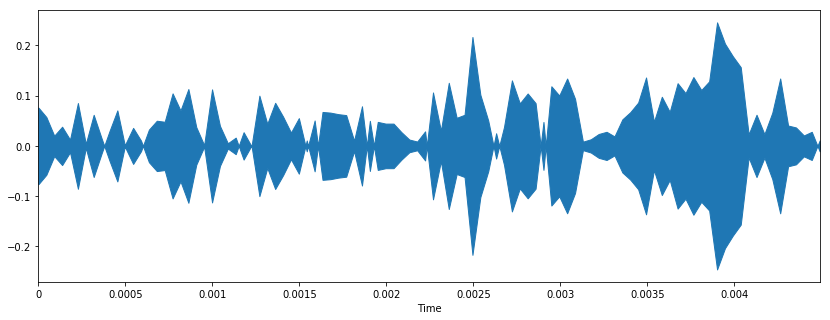

In [32]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

fig = plt.figure(figsize = (14,5))
librosa.display.waveplot(y[0:100], sr=sr)

### 2.2. Time-Frequency - Spectrogram

시간축과 주파수 축의 변화에 따라서, 진폭 차이를 색상을 통해 보여줍니다.
스펙토로그램은 소리나 파동을 시각화하여 파악하는 도구로, waveform 과 spectrum의 특징이 조합되어 있습니다.

- waveform : 시간축 변화에 따라 진폭의 변화를 시각화합니다.
- spectrum : 주파수 축의 변화에 따라 진폭축의 변화를 볼수 있습니다.
- spectrogram : 시간축과 주파수 축 변화에 따라 진폭차이를 색상을 통해 보여줍니다.

In [8]:
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
D[0:1] ,D.shape

(array([[-30.147816, -34.803604, -34.54348 , ..., -39.626945, -23.270845,
         -18.023369]], dtype=float32), (1025, 1293))

Text(0.5, 1.0, 'Linear-frequency power spectrogram')

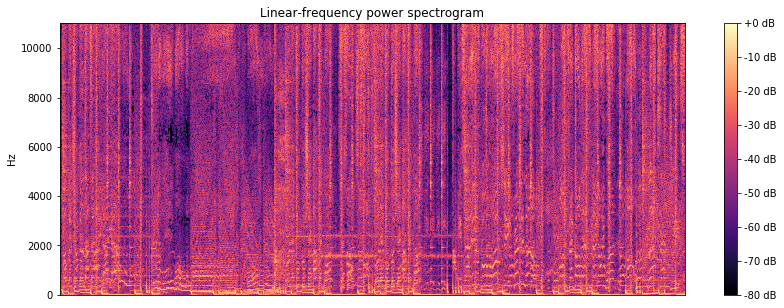

In [9]:
fig = plt.figure(figsize = (14,5))
librosa.display.specshow(D, y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

### Chroma

주파수 영역을 우리가 알고 있는 Note영역으로 표현이 가능합니다.

In [10]:
chroma_orig = librosa.feature.chroma_cqt(y=y, sr=sr)
chroma_orig, len(chroma_orig)

(array([[0.59038242, 0.7461021 , 0.75147846, ..., 1.        , 1.        ,
         1.        ],
        [0.36844482, 0.59948876, 0.81672093, ..., 0.53529465, 0.65245126,
         0.68385946],
        [0.48278984, 0.5211544 , 0.95343269, ..., 0.15190836, 0.21428718,
         0.28319899],
        ...,
        [0.99056947, 0.76992381, 0.93661001, ..., 0.1556566 , 0.2005285 ,
         0.17159951],
        [0.43477063, 0.60112754, 0.82351425, ..., 0.15948883, 0.21720687,
         0.22873105],
        [0.23772641, 0.59970536, 0.7383609 , ..., 0.24446114, 0.29981359,
         0.33476783]]), 12)

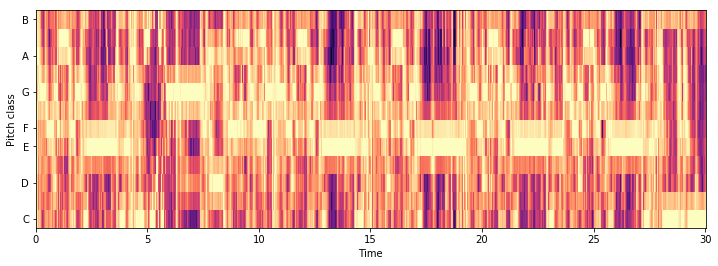

In [11]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(chroma_orig, ref=np.max),y_axis='chroma', x_axis='time')

In [12]:
y_harm = librosa.effects.harmonic(y=y, margin=8)
chroma_os_harm = librosa.feature.chroma_cqt(y=y_harm, sr=sr, bins_per_octave=12*3)

In [13]:
chroma_os_harm

array([[0.2359746 , 0.22904428, 0.22057429, ..., 1.        , 1.        ,
        1.        ],
       [0.31155613, 0.30312472, 0.3002107 , ..., 0.47716859, 0.4826941 ,
        0.48622419],
       [0.21385461, 0.2088221 , 0.2204285 , ..., 0.12164078, 0.11986572,
        0.11965525],
       ...,
       [0.93760932, 0.96238132, 1.        , ..., 0.00883764, 0.00931324,
        0.00868543],
       [0.43522757, 0.43796145, 0.46348647, ..., 0.01617153, 0.01508226,
        0.01307395],
       [0.16509672, 0.17313346, 0.17027926, ..., 0.04269641, 0.0405178 ,
        0.03819409]])

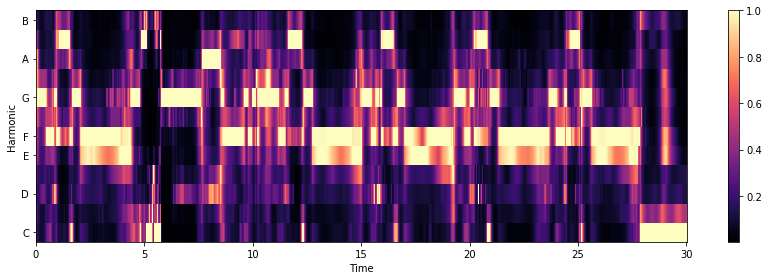

In [15]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma_os_harm, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.ylabel('Harmonic')
plt.tight_layout()

### Onset

Onset detection

In [16]:
onset_frames = librosa.onset.onset_detect(y, sr=sr)
onset_frames

array([   3,    8,   31,   44,   55,   66,   77,   89,  101,  124,  146,
        158,  170,  181,  187,  192,  241,  264,  273,  331,  377,  423,
        446,  465,  469,  492,  504,  517,  527,  538,  550,  561,  573,
        580,  584,  596,  607,  630,  641,  648,  653,  676,  688,  711,
        722,  734,  746,  758,  769,  792,  803,  815,  821,  826,  838,
        861,  874,  885,  907,  931,  953,  966,  976,  988, 1000, 1022,
       1046, 1068, 1092, 1103, 1115, 1138, 1161, 1172, 1176, 1184, 1193,
       1195, 1202, 1207, 1230, 1240, 1276])

In [17]:
onset_times = librosa.frames_to_time(onset_frames, sr=sr)
onset_times

array([ 0.06965986,  0.18575964,  0.71981859,  1.021678  ,  1.27709751,
        1.53251701,  1.78793651,  2.06657596,  2.34521542,  2.87927438,
        3.39011338,  3.66875283,  3.94739229,  4.20281179,  4.34213152,
        4.45823129,  5.59600907,  6.13006803,  6.33904762,  7.68580499,
        8.7539229 ,  9.82204082, 10.35609977, 10.79727891, 10.89015873,
       11.42421769, 11.70285714, 12.00471655, 12.2369161 , 12.4923356 ,
       12.77097506, 13.02639456, 13.30503401, 13.4675737 , 13.56045351,
       13.83909297, 14.09451247, 14.62857143, 14.88399093, 15.04653061,
       15.16263039, 15.69668934, 15.9753288 , 16.50938776, 16.76480726,
       17.04344671, 17.32208617, 17.60072562, 17.85614512, 18.39020408,
       18.64562358, 18.92426304, 19.06358277, 19.17968254, 19.458322  ,
       19.99238095, 20.29424036, 20.54965986, 21.06049887, 21.61777778,
       22.12861678, 22.43047619, 22.66267574, 22.94131519, 23.21995465,
       23.73079365, 24.28807256, 24.79891156, 25.35619048, 25.61

In [18]:
onset_samples = librosa.frames_to_samples(onset_frames)
onset_samples

array([  1536,   4096,  15872,  22528,  28160,  33792,  39424,  45568,
        51712,  63488,  74752,  80896,  87040,  92672,  95744,  98304,
       123392, 135168, 139776, 169472, 193024, 216576, 228352, 238080,
       240128, 251904, 258048, 264704, 269824, 275456, 281600, 287232,
       293376, 296960, 299008, 305152, 310784, 322560, 328192, 331776,
       334336, 346112, 352256, 364032, 369664, 375808, 381952, 388096,
       393728, 405504, 411136, 417280, 420352, 422912, 429056, 440832,
       447488, 453120, 464384, 476672, 487936, 494592, 499712, 505856,
       512000, 523264, 535552, 546816, 559104, 564736, 570880, 582656,
       594432, 600064, 602112, 606208, 610816, 611840, 615424, 617984,
       629760, 634880, 653312])

In [19]:
clicks = librosa.clicks(times=onset_times, length=len(y))
ipd.Audio(y+clicks, rate=sr)

### Harmony and Percussive

/Users/seungheondoh/anaconda3/envs/python3.6/lib/python3.6/site-packages/librosa/core/spectrum.py:983: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


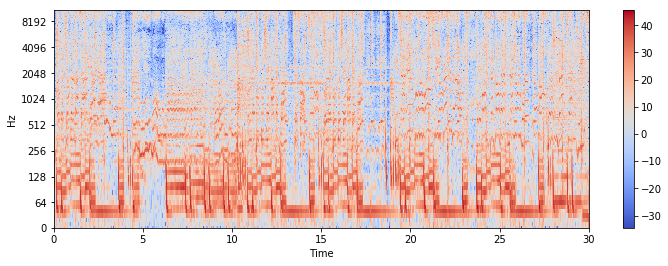

In [20]:
plt.figure(figsize=(12, 4))
X = librosa.stft(y)
Xmag = librosa.amplitude_to_db(X)
librosa.display.specshow(Xmag, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [21]:
H, P = librosa.decompose.hpss(X)
Hmag = librosa.amplitude_to_db(H)
Pmag = librosa.amplitude_to_db(P)

In [22]:
h = librosa.istft(H)
ipd.Audio(h, rate=sr)

In [23]:
p = librosa.istft(P)
ipd.Audio(p, rate=sr)

### Beat and Tempo

In [24]:
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)

In [25]:
tempo

112.34714673913044

In [26]:
beats

array([   9,   32,   55,   78,  101,  124,  147,  170,  193,  218,  241,
        264,  286,  309,  331,  354,  377,  400,  423,  447,  470,  493,
        517,  539,  562,  584,  607,  631,  654,  677,  700,  723,  746,
        769,  792,  815,  839,  862,  885,  908,  931,  954,  977, 1000,
       1023, 1046, 1069, 1092, 1115, 1138, 1161, 1184, 1207])

In [27]:
librosa.frames_to_time(beats, sr=sr)

array([ 0.20897959,  0.74303855,  1.27709751,  1.81115646,  2.34521542,
        2.87927438,  3.41333333,  3.94739229,  4.48145125,  5.06195011,
        5.59600907,  6.13006803,  6.64090703,  7.17496599,  7.68580499,
        8.21986395,  8.7539229 ,  9.28798186,  9.82204082, 10.37931973,
       10.91337868, 11.44743764, 12.00471655, 12.51555556, 13.04961451,
       13.56045351, 14.09451247, 14.65179138, 15.18585034, 15.7199093 ,
       16.25396825, 16.78802721, 17.32208617, 17.85614512, 18.39020408,
       18.92426304, 19.48154195, 20.01560091, 20.54965986, 21.08371882,
       21.61777778, 22.15183673, 22.68589569, 23.21995465, 23.75401361,
       24.28807256, 24.82213152, 25.35619048, 25.89024943, 26.42430839,
       26.95836735, 27.4924263 , 28.02648526])

In [28]:
onset_env = librosa.onset.onset_strength(y, sr=sr,aggregate=np.median)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env,sr=sr)

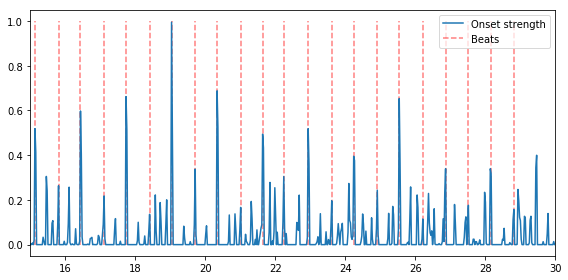

In [44]:
hop_length = 512
plt.figure(figsize=(8, 4))
times = librosa.frames_to_time(np.arange(len(onset_env)),sr=sr, hop_length=hop_length)
plt.plot(times, librosa.util.normalize(onset_env),label='Onset strength')
plt.vlines(times[beats], 0, 1, alpha=0.5, color='r',linestyle='--', label='Beats')
plt.legend(frameon=True, framealpha=0.75)
plt.xlim(15, 30)
plt.gca().xaxis.set_major_formatter(librosa.display.TimeFormatter())
plt.tight_layout()

In [45]:
dtempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr,aggregate=None)
len(dtempo)

1293

In [46]:
tempo = np.asscalar(tempo)
ac = librosa.autocorrelate(onset_env, 2*sr // hop_length)
freqs = librosa.tempo_frequencies(len(ac), sr=sr, hop_length=hop_length)

In [47]:
len(onset_env),len(ac)

(1293, 86)

In [48]:
tg = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr,hop_length=hop_length)
tg, len(tg)

(array([[ 1.00000000e+00,  1.00000000e+00,  1.00000000e+00, ...,
          1.00000000e+00,  1.00000000e+00,  1.00000000e+00],
        [ 5.38732586e-01,  5.38219217e-01,  5.37708881e-01, ...,
          5.20655122e-01,  5.20681773e-01,  5.20703957e-01],
        [ 1.48331237e-01,  1.47620664e-01,  1.46906728e-01, ...,
          8.11977558e-02,  8.10293945e-02,  8.08610579e-02],
        ...,
        [ 2.67933439e-16,  2.44858662e-16,  2.00934941e-16, ...,
          5.29315833e-18, -1.80873469e-17, -3.57034107e-17],
        [ 3.31687549e-16,  3.07476027e-16,  2.89808654e-16, ...,
          2.41169442e-16,  2.00304868e-16,  1.87562294e-16],
        [ 5.05072520e-16,  4.94141673e-16,  4.43221599e-16, ...,
          5.10003095e-16,  4.54509305e-16,  4.55247944e-16]]), 384)

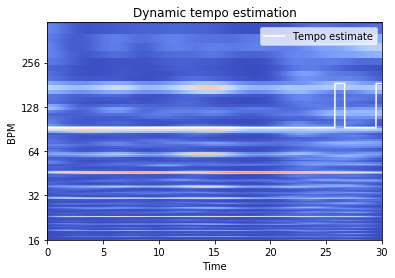

In [49]:
plt.figure()
librosa.display.specshow(tg, x_axis='time', y_axis='tempo')
plt.plot(librosa.frames_to_time(np.arange(len(dtempo))), dtempo,color='w', linewidth=1.5, label='Tempo estimate')
plt.title('Dynamic tempo estimation')
plt.legend(frameon=True, framealpha=0.75)

### NMF Source Seperation

In [50]:
import scipy
figsize=(8, 4)

In [51]:
fs_target = 22050
x = np.arange(len(y))/fs_target
# 80ms frame size를 사용합니다.
frame_size = 80e-3
# 40ms hop length 를 사용하려고한다.
overlap = 0.5
dft_size = frame_size

# fft detail
n_fft = int(frame_size*fs_target)
hop_length = int((1-overlap)*frame_size*fs_target)
window = scipy.signal.hann(n_fft)
print(n_fft, hop_length)

1764 882


(883, 751)
1764 882


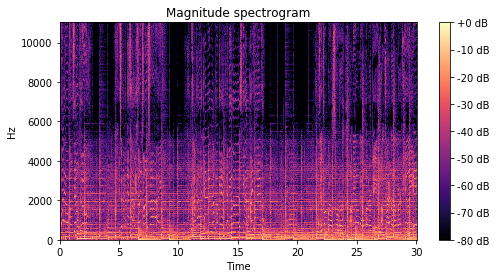

In [52]:
spec = librosa.core.stft(y, n_fft = n_fft, hop_length = hop_length, window = scipy.signal.hann(n_fft), center= True )
print(np.shape(spec))
print(n_fft, hop_length)
D = librosa.amplitude_to_db(np.abs(spec), ref=np.max)
plt.figure(figsize=figsize)
librosa.display.specshow(D, y_axis='linear', x_axis='time', sr = fs_target, hop_length = n_fft/2)
plt.colorbar(format='%+2.0f dB')
plt.title("Magnitude spectrogram")
plt.show()

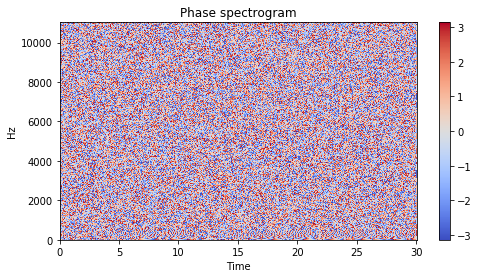

In [53]:
E = np.angle(spec, deg = 0)
plt.figure(figsize=figsize)
librosa.display.specshow(E, y_axis='linear', x_axis='time', sr = fs_target, hop_length = n_fft/2)
plt.title("Phase spectrogram")
plt.colorbar()
plt.show()

In [54]:
from sklearn.decomposition import NMF

model = NMF(n_components=3, init='nndsvd', random_state=0,solver="mu",beta_loss="frobenius",max_iter = 1000)
W = model.fit_transform(np.abs(spec))
H = model.components_
print(model.reconstruction_err_)

/Users/seungheondoh/anaconda3/envs/python3.6/lib/python3.6/site-packages/sklearn/decomposition/nmf.py:212: UserWarning: The multiplicative update ('mu') solver cannot update zeros present in the initialization, and so leads to poorer results when used jointly with init='nndsvd'. You may try init='nndsvda' or init='nndsvdar' instead.
  UserWarning)


1617.4189484492947


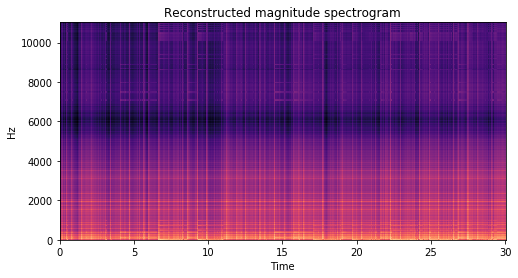

In [55]:
D = librosa.amplitude_to_db((np.matmul(W,H)), ref=np.max)
plt.figure(figsize=figsize)
librosa.display.specshow(D, y_axis='linear', x_axis='time',sr = fs_target, hop_length = n_fft/2)
plt.title("Reconstructed magnitude spectrogram")
plt.show()

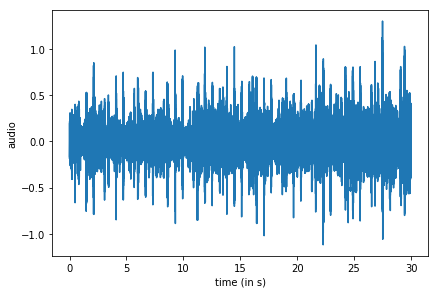

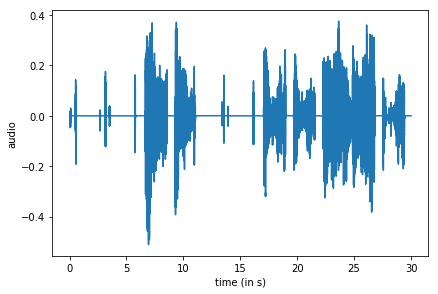

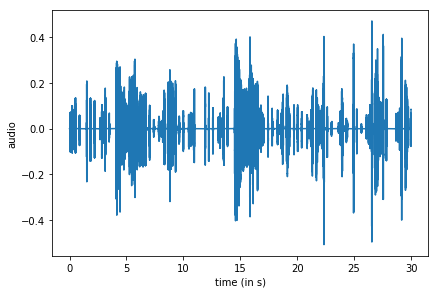

In [56]:
from scipy.io.wavfile import write

phase = np.angle(spec)
total = 0
audios = []
for i in range(0,np.shape(W)[1]):
    component= np.outer(W[:,i],(H[i,:]))
    component = component*phase
    audio2 = librosa.core.istft(component, hop_length=n_fft//2)
    audios.append(audio2)
    plt.figure()
    plt.plot(x[:661500],audio2)
    plt.tight_layout()
    plt.xlabel("time (in s)")
    plt.ylabel("audio")
    plt.show()
    total = total + audio2 
#     write("component" +str(i) + ".wav", 22050, audio2)
    ipd.display(ipd.Audio(audio2, rate=sr))
    audio2_rescaled = audio2/ np.max(audio2)
#     write("component" +str(i) + "_rescaled.wav", 22050, audio2_rescaled)
#     ipd.display(ipd.Audio(audio2_rescaled, rate=sr))

In [57]:
total

array([0.20773354, 0.20142695, 0.15384851, ..., 0.32133666, 0.26401845,
       0.38001743], dtype=float32)

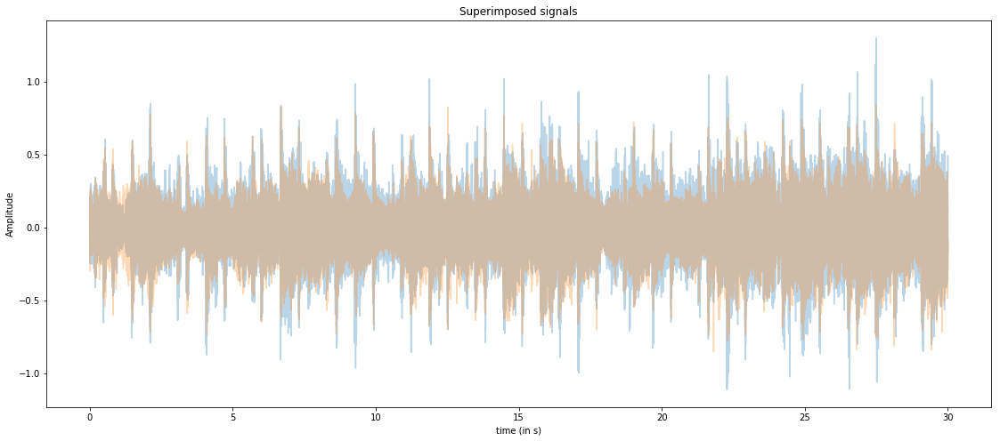

In [58]:

# plotting sum of components and the original signal
plt.figure(figsize = (19,8))
plt.title("Superimposed signals")
plt.xlabel("time (in s)")
plt.ylabel("Amplitude")
plt.plot(x[:661500],total,alpha = 0.3)
plt.plot(x,y,alpha = 0.3)
plt.show()

error = np.array(total) - np.array(y[:661500])

### Tag

- Millionsong data - mood tag가 확실한 친구
- 단어별 mood space
- VQA

-------------------
GrooAVE velocity

멜로디에 드럼 라인이 잘들어갔다 Lofi-hip
멜로디에 드럼이다. 
- Rythm analysis
- Score level
    - Sample 에 대해서 무엇을뽑는가?
- Sentiment analysis
    - Acoustic
    - Mood analysis
    
드럼의 latent space, 그리고 사람의 mood tag를 사용 해본다.
Sample을 선택하고 Drum을 찍는다. vst는 시퀀스에 샘플을 바꾸면서 소리의 변화를 본다.

Drum의 meta data

### 멀티트렉 레이어를 사용한다.

### Image Segmentation 알고리즘을 찾아보자.

### 시맨틱 레이블링.
tempo 역시 sementic한 레이블이있다. tempo로 레이블을 넣는다.

- 음악에서 관련된 정보를 만들어준다.
- Sample과 mating score를 넣어준다.
- Percurssive data
    - drum tag가 있다
    - multi-track recoding db

MIR커뮤니티의 논문, audio visual, audio book

Loss weight and Events based Loss

- OuterHair-SE 
- GRU
- FML Small
- 